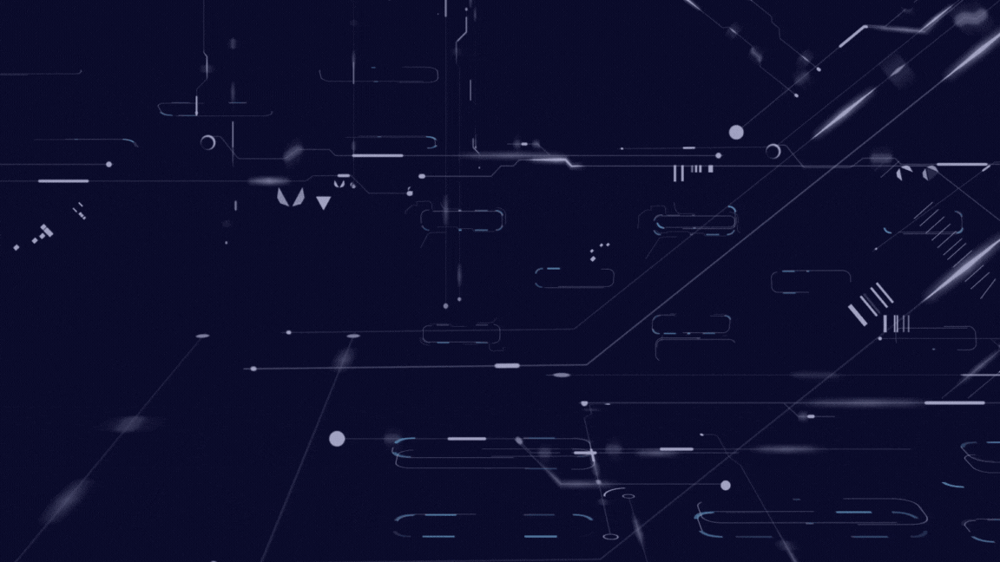


### 


## Initial Focus 

The goal of the project is to improve Axon's NPS score by better understanding customer feedback. This will be achieved by developing a machine learning model to categorize free-text responses and generating reports to identify areas for improvement. Ultimately, the objective is to assist Axon enhance the customer experience and drive business growth.

<hr>

## Background Information

Axon is the leading provider of public safety technology solutions, which includes body cameras and digital evidence management systems. The company is deeply invested in customer experience and uses Net Promoter Score (NPS) as a key metric to measure customer satisfaction and to incentivize all Axon employees to prioritize customer needs. Axon runs an NPS based customer survey throughout the year, gathering thousands of responses annually to continually measure and shape the customer experience. 

Axon uses NPS as a key metric to measure customer satisfaction and proactively address any potential issues. They classify survey responses into 6 categories and prioritize areas of improvement based on NPS scores to enhance the customer experience.

<hr>

## Problem Statement

With business growing and hence increase in customer feedbacks, the current process may lead to delayed response times and missed opportunities to enhance the customer experience, which can ultimately result in lower NPS scores and negative business impact. 

Therefore, it is essential to automate the existing process using a self-learning ML model which can carry out feedback analysis accurately and help gain further insights into the concern areas to improve the NPS score and overall customer experience.

<hr>

## Stakeholders 

•	Chris Nielsen (Sponsor) – VP, Digital CX <br>
•	Sam Chen (Technical SME) – Director, Digital CX <br>
•	Noah Burbank - Data Architect <br>
•	Alex Birutis (Technical SME) – Technical Ninja/utility knife <br>
•	Kyle Turner (Business Partner) – Sr Manager, Customer Loyalty <br>
•	Micah Meekins (Business Partner) – NPS Analyst <br>
•	Bella Gianninni (Business Partner) – Director, Customer Loyalty <br>

This model is developed for the Axon NPS Customer survey team.

<hr>


## Proposal

The proposed project aims to utilize machine learning for efficient categorization of customer feedback into 6 categories: “Product”, “Cost”, “Customer Service”, “Training”, “Sales”, and “Others”. This will help Axon proactively identify problem and streamline the process. By reducing the manual effort required for categorization, machine learning models will provide accurate results, ultimately leading to better customer satisfaction and an improved NPS score.

> - Target Variable: primary_category

| Feature          	| Descriptions                              	|
| :---              | :---                                          |
| customer_experience:         	| Feedback provided by the customer. (Free-text)                	|
| NPS:      	    | Net promoter score                          	|
| Primary Category: 	        | Pre-defined categories (Cost, Customer Service, Customer Success, Product, Professional Services, Sales, Training, Others) |
| processed: | Processed free-text column|

<hr>

## Performance Metrics
We have performed Binary classification on Product category out of 6 categories.<br>

**Precision**: Precision tells us about the success probability of making a correct category class classification. It's computed as the number of True Positives divided by the total number of positive calls.
For instance, fraction of customer reviews that were predicted as ‘Product’ of the total reviews that belonged to ‘Product’ category.<br>

**Recall**: The recall of the model measures the percentage of actual ‘Product’ category reviews that were correctly identified as the ‘Product’ category by the model.<br>

**Accuracy**: a metric that measures the overall correctness of the model's predictions. It represents the proportion of correctly classified instances over the total number of instances in the dataset.<br>

**False Positive and False Negative**: If customer feedback that actually belongs to the "Product" class is labeled as "Cost issue", both precision and recall would be costly in terms of their impact on business decisions and customer satisfaction. In this scenario, the model's prediction is that the feedback belongs to the "Cost" class, while the ground truth (actual label) is that it belongs to the "Product" class. 

For precision as a metric of interest, the cost of mislabeling feedback as a "Cost issue" when it actually belongs to the "Product" class would result in incorrect business decisions, as it would lead to a misallocation of resources to address an issue that is not the root cause of the customer's problem. This could potentially result in further dissatisfaction or even loss of customers.

For recall as a metric of interest, mislabeling feedback as "Cost issue" when it actually belongs to the "Product" class would result in missing important feedback that could provide valuable insights for businesses to improve their products or services. This could lead to missed opportunities to address real customer concerns and could result in decreased customer satisfaction and loyalty.

It would be very costly for Axon to misclassify any the labels. Both False Positives, and False Negatives are costly for the business. Additionally, it is important to consider the potential costs associated with both precision and recall in the context of the specific business problem and decision-making process. This can help to optimize the model performance and improve customer satisfaction.

<hr>


## Specification

- Python: 3.9.12
- Pandas: 1.4.3
- Seaborn: 0.11.2
- sklearn: 1.1.2.
- Numpy: 1.21.5
- Spacy: 3.3.1

<hr>


## Table of Contents: <a class="anchor" id="steps"></a>
- [1. Libraries & Custom Functions](#libraries)
- [2. Data Wrangling](#wrangle)
   - [2.1 Data Gathering](#gather)
   - [2.2 Data Assessment](#assess)
   - [2.3 Data Cleaning](#clean)
- [3. Feature Selection](#feature)
- [4. Model Building](#model)
- [6. Testing](#testing)
<hr>

## 1. Libraries & Custom Functions <a class="anchor" id="libraries"></a>

> [Table of Contents](#steps)

In [1]:
# Importing pre-requisite Libraries.
# ------------------------------------------------------------------------------------------------------------------------------
import pandas as pd                                                     # Pandas offers data structures and operations for manipulating numerical tables and time series.
import numpy as np                                                      # NumPy offers support for large, multi-dimensional arrays and matrices, along with a large collection 
                                                                        # of high-level mathematical functions to operate on these arrays.
import pickle                                                           # Using Pickle to convert a Python object into a byte stream to store it in a file/database, 
                                                                        # maintain program state across sessions, making it easier to work with in deployments. 
import seaborn as sns                                                   # Importing Seaborn, A library for making statistical graphics in Python.
import matplotlib.pyplot as plt                                         # Importing matplotlib.pyplot is a collection of functions that make matplotlib work like MATLAB.
import plotly.graph_objects as go                                       # Importing the graph_objects module from Plotly library for creating interactive data visualizations
import plotly.express as px                                             # Plotly provides online graphing, analytics, and statistics tools for individuals and collaboration.
import ipywidgets as widgets                                            # Import the ipywidgets library and alias it as 'widgets' for ease of use
from IPython.display import display, HTML, clear_output                 # Import display and HTML functions for customizing output display
import time
import os
from datetime import datetime

# Importing Sklearn Models and the required Libraries for ML operations.
# ------------------------------------------------------------------------------------------------------------------------------
from sklearn.linear_model import LogisticRegression                     # The logistic model is a statistical model that models the probability of one event taking place 
                                                                        # by having the log-odds for the event be a linear combination of one or more independent variables.                      
from sklearn.neighbors import KNeighborsClassifier                      # K-nearest neighbors is a supervised learning algorithm used for classification and regression tasks.
from sklearn import tree                                                # Importing the tree module from scikit-learn (sklearn) library for decision tree-based machine learning models.
from sklearn.tree import DecisionTreeClassifier                         # DecisionTreeClassifier is used for creating decision tree models, which are a type of supervised learning algorithm used for both classification and regression tasks.
from sklearn.ensemble import RandomForestClassifier                     # Random Forest Classifier is an ensemble learning method that combines multiple decision trees to create a more robust and accurate model.
from sklearn.svm import SVC                                             # The SVC class provides an implementation of the SVM algorithm for classification tasks. It can handle both linear and non-linear data by finding the optimal hyperplane or kernel function to separate classes.
from imblearn.over_sampling import SMOTE                                # The SMOTE function is used to generate synthetic examples of the minority class in imbalanced datasets. It creates synthetic examples by interpolating between instances of the minority class, effectively increasing the number of minority class samples in the dataset.

# Importing the metrics module for evaluating model performance.
# ------------------------------------------------------------------------------------------------------------------------------    
from sklearn.metrics import make_scorer, precision_score, recall_score, accuracy_score, f1_score         
                                                                        # Create a custom scoring function using the make_scorer function for model evaluation during cross-validation.
                                                                        # Precision, recall, accuracy, and F1-score are metrics used for evaluating classification models.
                                                                        # These metrics provide insights into different aspects of model performance, such as the ability to correctly classify positive and negative samples, overall accuracy, and the trade-off between precision and recall.
from sklearn.metrics import mean_absolute_percentage_error, mean_absolute_error, r2_score, mean_squared_error
                                                                        # The mean_absolute_percentage_error, mean_absolute_error, r2_score, and mean_squared_error functions are commonly used metrics for evaluating regression models.
import statsmodels.api as sm                                            # The statsmodels.api module is a Python library for conducting statistical analysis, including linear regression, logistic regression, time series analysis, and more.
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV, cross_val_score, KFold
                                                                        # The train_test_split function is commonly used to split the data into training and testing sets for model evaluation and validation.
                                                                        # The cross_val_score function is used for cross-validation, which is a technique for assessing the performance of a model by training and evaluating it on multiple subsets of data.
                                                                        # The RandomizedSearchCV function is used for hyperparameter tuning using randomized search, which is a technique for finding optimal hyperparameter values for a model by sampling from a distribution of possible values.
                                                                        # The KFold function is used to create K-fold cross-validation splits, where K is the number of folds. It can be used in conjunction with cross_val_score for performing K-fold cross-validation.
from sklearn.metrics import confusion_matrix, plot_confusion_matrix     # The confusion_matrix function is used to compute the confusion matrix, which is a table that describes the performance of a classification model by showing the counts of true positive, true negative, false positive, and false negative predictions.
                                                                        # The plot_confusion_matrix function is used to plot the confusion matrix for visualization purposes, making it easier to interpret and analyze the performance of a classification model.
from sklearn import metrics                                             # Importing error metrics here.

# Importing libraries for NLP operations.
# ------------------------------------------------------------------------------------------------------------------------------
import spacy                                                            # The spacy library is a popular tool for natural language processing (NLP) in Python. It provides various NLP functionalities, such as tokenization, part-of-speech tagging, named entity recognition, dependency parsing, and more.
import gensim.downloader as api                                         # The api module in Gensim allows for easy access to pre-trained word embeddings, which are word representation vectors learned from large corpora of text. These pre-trained word embeddings can be used as features in natural language processing (NLP) and text mining tasks, such as word similarity, document classification, and text generation.
from spacy.pipeline import EntityRuler                                  # EntityRuler for creating custom entity recognition rules 
from spacy.pipeline import AttributeRuler                               # For creation of custom token attributes based on specific patterns or rules.
from imblearn.pipeline import Pipeline, make_pipeline                   # The Pipeline function is used to define a sequence of data preprocessing and model training steps in a machine learning pipeline. Each step is defined as a tuple containing a name for the step and an instance of a transformer or an estimator.
                                                                        # The make_pipeline function is a convenient function for creating a pipeline without explicitly specifying names for the steps. It automatically generates names for the steps based on the names of the classes of the transformer or estimator objects.
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
                                                                        # The CountVectorizer function is used to convert a collection of text documents to a matrix of token counts. It creates a sparse matrix representation where each row represents a document and each column represents a unique token, with the cell value indicating the count of that token in the corresponding document.
                                                                        # The TfidfVectorizer function is used to convert a collection of text documents to a matrix of TF-IDF (Term Frequency-Inverse Document Frequency) features. It creates a sparse matrix representation where each row represents a document and each column represents a unique token, with the cell value indicating the TF-IDF score of that token in the corresponding document.
# wv = KeyedVectors.load_word2vec_format('word2vec-google-news-300.bin', binary=True)

# ------------------------------------------------------------------------------------------------------------------------------
import warnings
warnings.simplefilter("ignore")                                         # Warnings have been turned off, after carefuly examining each of them
pd.set_option('display.max_columns', None)                              # To print the above output in a wider format. This attribute is used to set the no. of columns 
pd.set_option('display.max_rows', None)                                 # To print the above output in a wider format. This attribute is used to set the no. of columns 
pd.options.display.float_format = '{:.2f}'.format                       # To get rid of scientific notations used to disply large numbers. 

C:\Users\Amit\anaconda3\lib\site-packages\gensim\utils.py:1197: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


### Function Definitions <a class="anchor" id="functions"></a>

> [Table of Contents](#steps)

In [2]:
# Custom function to plot the Precision, Recall, F-1 Score, Accuracy across a list of probability thresholds.

def thresh_plot(result):                                                
    fig = go.Figure()                                                   # Initialize a Plotly figure
    # Add traces for different evaluation metrics (Precision, Recall, F1-score, Accuracy)
    fig.add_trace(go.Scatter(x=result['Threshold'], y=result['Precision'],
                        mode='lines+markers',
                        name='Precision'))
    fig.add_trace(go.Scatter(x=result['Threshold'], y=result['Recall'],
                        mode='lines+markers',
                        name='Recall'))
    fig.add_trace(go.Scatter(x=result['Threshold'], y=result['F1-score'],
                        mode='lines+markers', name='F1-score'))
    fig.add_trace(go.Scatter(x=result['Threshold'], y=result['Accuracy'],
                        mode='lines+markers', name='Accuracy'))
    
    fig.update_layout(yaxis_range=[0,1])
    fig.show()                                                          # Show the Plotly figure
    
# ------------------------------------------------------------------------------------------------------------------------------

# Custom function that creates and displays a widget for selecting a probability threshold for a model.

def threshold_widget(threshold):
#     a = widgets.FloatText(                                             # Create FloatText widget with specified properties
#     step = 0.05,
#     value = round(threshold,2),
#     min = 0,
#     max = 1,
#     layout=widgets.Layout(width='50%')
#     )
#     b = widgets.FloatSlider(                                           # Create FloatSlider widget with specified properties
#         min=0,
#         max=1,
#         step=0.05,
#         description='Slider:',
#         value = round(threshold,2),
#         layout=widgets.Layout(width='50%')
#     )

    print("Select a probability threshold for this model. (Suggested :{})".format(round(threshold,2)))
#     display(a)                                                         # Display the FloatText and FloatSlider widgets
#     display(b)
#     time.sleep(60)
    user_input = input("Confirm Threshold: ")

#     return(widgets.jslink((a, 'value'), (b, 'value')))                       # Create a link between the FloatText and FloatSlider widgets and return it
    return(float(user_input))
#     return(round(threshold,2))


# ------------------------------------------------------------------------------------------------------------------------------

# Custom function below is used to display performance measures
# Required inputs are the model name and the two test data objects (X,y)

def class_perf_measures(model,X_test,y_test):
    # Create empty lists to store metric values created within loop
    TP = []
    TN = []
    FP = []
    FN = []
    recall = []
    precision = []
    F1 = []
    Accuracy = []
    FNR = []
    FPR = []

    # Create list of probability threshold values to loop over
    threshold = np.arange(0,1.1,0.05).tolist()
    best_f1_score = 0
    t = 0.5
    j = 0
    
    # Start loop
    for i in threshold:
        # Create class assignments given threshold value
        y_test_pred_class = (model.predict_proba(X_test)[:,1] >= i).astype(int)
        # Append lists with metric values
        TP.append(metrics.confusion_matrix(y_test, y_test_pred_class)[1,1])
        TN.append(metrics.confusion_matrix(y_test, y_test_pred_class)[0,0])
        FP.append(metrics.confusion_matrix(y_test, y_test_pred_class)[0,1])
        FN.append(metrics.confusion_matrix(y_test, y_test_pred_class)[1,0])
        recall.append(metrics.recall_score(y_test, y_test_pred_class).round(3))
        precision.append(metrics.precision_score(y_test, y_test_pred_class).round(3))
        F1.append(metrics.f1_score(y_test, y_test_pred_class).round(2))
        Accuracy.append(metrics.accuracy_score(y_test, y_test_pred_class).round(2))
        FPR.append((metrics.confusion_matrix(y_test, y_test_pred_class)[0,1] / 
                (metrics.confusion_matrix(y_test, y_test_pred_class)[0,1] + 
                 metrics.confusion_matrix(y_test, y_test_pred_class)[0,0]) ).round(2))
        FNR.append((metrics.confusion_matrix(y_test, y_test_pred_class)[1,0] / 
                (metrics.confusion_matrix(y_test, y_test_pred_class)[1,0] + 
                 metrics.confusion_matrix(y_test, y_test_pred_class)[1,1]) ).round(2))
        
        if F1[j] >= best_f1_score:
            best_f1_score = F1[j]
            t = i
        j+=1
        
    # Create dataframe
    result = pd.DataFrame({"Threshold":threshold,
                           "TP":TP,
                           "TN":TN,
                           "FP":FP,
                           "FPR":FPR,
                           "FN":FN,
                           "FNR":FNR,
                           "Precision":precision,
                           "Recall":recall,
                           "F1-score":F1,
                           "Accuracy": Accuracy,
                          })

    # add script to plot accuracy, precision, recall for each threshold
    # Create traces
    
    display(result)
    thresh_plot(result)
    return(t)
    
# ------------------------------------------------------------------------------------------------------------------------------

# The following funtion helps in creation of a new rule related to the product that Axon has. It takes input a list of all 
# the product you want the model to classify as a PRODUCT (ner), and outputs a pattern that is to be fed to the entity ruler.

def add_product_rule(category, product_list):
    patterns = []
    for x in product_list:
        ls = []
        temp = x.split(" ")                                            # Split the product name into tokens by space
        for z in range(len(temp)):
            ls.append({"LOWER": temp[z].lower()})                      # Create a dictionary for each token with "LOWER" key and lowercased value, and append to the list
        patterns.append({"label": category, "pattern" : ls})           # Create a dictionary for the pattern with "label" key as the custom category label and "pattern" key as the list of tokens
    return patterns


# ------------------------------------------------------------------------------------------------------------------------------

# Preprosessing the free-text data, by lemmatizing, removing stop words, and punctuations. This function returns a processed
# free-text data (one line) joined by space. review (str): Input text to be normalized, lowercase (bool): Flag indicating whether to convert the text to lowercase. remove_stopwords (bool): Flag indicating whether to remove stopwords.         punctuations_rm (bool): Flag indicating whether to remove punctuations

def normalize(review, lowercase, remove_stopwords, punctuations_rm):
    if lowercase:
        review = review.lower()                                        # Converting the text to lowercase if the `lowercase` flag is set
    doc = nlp(review)
    lemmatized = list()
    for token in doc:
          if remove_stopwords and not token.is_stop:                   # Checking if the token is a stopword and the `remove_stopwords` flag is set
            if punctuations_rm:
                if not token.is_punct:                                 # Checking if the token is a punctuation and the `punctuations_rm` flag is set
                    lemmatized.append(token.lemma_)                    # Lemmatizing the token and appending to the list
            else: 
                lemmatized.append(token.lemma_)
    return " ".join(lemmatized)                                        # Joining the lemmatized tokens with space and returning as normalized text


# ------------------------------------------------------------------------------------------------------------------------------

# Function to generate word embeddings using pre-trained word vectors

def generate_word_embeddings(sent):
    words = sent.split()                                               # Splitting the input sentence into words
    word_vectors = [wv[word] for word in words if word in wv]          # Extracting word vectors for words present in the pre-trained word vectors
    if word_vectors:
        return np.mean(word_vectors, axis=0)                           # Calculating the average word vector
    else:
        return np.zeros((300,))                                        # Returning a zero vector if no word vectors are found for the input sentence
    
    
# ------------------------------------------------------------------------------------------------------------------------------

# Function to create a new vector that keeps a check on the type of ner tags used in the sentences and mark it as 1 on encountering the respective ner tag, to further feed this as a feature to the model.

def generate_ner_tags(doc):
    ner_dict = dict.fromkeys(labels, 0)                                # Creating a dictionary to store NER labels and initializing all values to 0
    # Using a dictionary comprehension
    ner_dict = {labels: 0 for labels in labels}
    doc = nlp(doc)
    for tokens in doc.ents:
        if tokens.label_ in ner_dict:                                  # Checking if the NER label is present in the dictionary
            ner_dict[tokens.label_]=1                                  # Setting the value to 1 if the NER label is found
    return(list(ner_dict.values()))                                    # Converting the dictionary values to a list and returning


# ------------------------------------------------------------------------------------------------------------------------------

# Function to prevent data leakage, and generate concatenated embedding for the word vectors including the ner_tags and text_length column

def train_test_generate(df, category):
    # To prevent Data leakage, for each run we will delete the rows that belong to more than 1 category, keeping just one, to prevent misclassification.
    # Update 'primary_category' column with binary values based on the category.
    df['primary_category'] =  df['primary_category'].apply(lambda x : 1 if x == str(category) else 0)
    # Create a list of 'customer_experience' values for duplicated rows where 'primary_category' is 1. (To prevent data leakage)
    ls = list(df[df.duplicated("customer_experience")&df['primary_category']==1]['customer_experience'])
    # Get the index of rows where 'customer_experience' is in the list 'ls' and 'primary_category' is not equal to 1
    drp_idx = df[df["customer_experience"].isin(ls)].query("primary_category != 1").index
    # Drop rows from 'df' based on 'drp_idx'
    df.drop(drp_idx, axis=0, inplace=True)
    
    # Splitting the df for training and testing in a 80:20 ratio.
    X_train, X_test, y_train, y_test = train_test_split(df[['embeddings','ner_tags','text_length']], df['primary_category'], test_size = 0.20, shuffle=True, stratify=df['primary_category'])
    
    # Convert 'embeddings', 'ner_tags', and 'text_length' columns to numpy arrays and stack them

    X_train1 = np.stack(X_train['embeddings'])
    X_train3 = np.stack(X_train['ner_tags'])
    X_train5 = np.reshape(np.array(X_train['text_length']), (-1, 1)) # Reshape to (n_samples, 1)

    X_test1 = np.stack(X_test['embeddings'])
    X_test3 = np.stack(X_test['ner_tags'])
    X_test5 = np.reshape(np.array(X_test['text_length']), (-1, 1)) # Reshape to (n_samples, 1)

    # Concatenate 'X_train1', 'X_train3', and 'X_train5' horizontally
    X_train = np.concatenate((X_train1, X_train3, X_train5),axis=1)

    # Concatenate 'X_test1', 'X_test3', and 'X_test5' horizontally
    X_test = np.concatenate((X_test1, X_test3, X_test5),axis=1)
    
    return(X_train, X_test, y_train, y_test)

# ------------------------------------------------------------------------------------------------------------------------------

# Function to find the best hyperparameters and the optimum threshold based on the best F-1 score, and return the
# model parameters and the threshold value. 

def model_training(category):
    
    X_train, X_test, y_train, y_test = train_test_generate(df.copy(), category)
    grid_search = RandomizedSearchCV(                                          # Randomized search cross-validation object with parameters.
    pipeline,                                                                  # The ML pipeline to be tuned.
    param_distributions = parameters,                                          # Dictionary of parameter distributions for random sampling.
    scoring = scoring,                                                         # List of scoring metrics for model evaluation. (Accuracy, Precision, and Recall)
    n_jobs = -1,                                                               # used to marshall all available CPUs.
    cv = KFold(n_splits=5, shuffle=True),                                      # Set up k-fold cross-validation with 5 splits and shuffling of data.
#     verbose = 50,                                                              # verbosity level to 1 for progress updates during grid search.
    n_iter = 200,
    refit = 'accuracy'                                                         # Thee scoring metric to be used for refitting the best model.
    )
    banners(category)                                                          # Calling banner function for banner display of categories.
    html_code = """
    <div style="text-align: center;">
        <img src="saber.gif" width="500" height="500" style="margin-left: auto; margin-right: auto;">
        <img src="Tuning.gif" width="300" height="300" style="margin-left: auto; margin-right: auto;">
    </div>
    """

    # Display the HTML code
    display(HTML(html_code))
    
    grid_search.fit(X_train, y_train)                                          # Fitting to find the parameters for grid search.                                                                       
    bestClassModel = grid_search.best_estimator_                               # assigning the model with the best parameters found from the tfidf pipeline, using the grid search
    bestClassModel.fit(X_train, y_train)                                       # Best class pipeline, found from randomized search.
    model = bestClassModel.named_steps['classifier'] 
    time.sleep(1)
    threshold = round(class_perf_measures(model, X_test, y_test),2)            # Assigning the best probability threshold based on the best F-1 score.

    time.sleep(1)
    y_pred = (model.predict_proba(X_test)[:,1] >= float(threshold)).astype(int)
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, cmap='YlGn', fmt='.0f', xticklabels=['Others', str(category)], yticklabels=['Others', str(category)])
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.show()
    
    return(model, threshold_widget(threshold))


# ------------------------------------------------------------------------------------------------------------------------------

# Function to display each category banner. 

def banners(category):
    banner_class = "my-banner"                                                 # Define the CSS class for the banner
    banner_html = f"<h1 class='{banner_class}'>{category}</h1>"                # Define the HTML code for the banner with formatting and styles
    
    # Define the CSS styles for the banner as a string
    css_style = f"""                                                        
        .{banner_class} {{                                                   
            background-color: #F1F5F5;
            color: #010101;
            padding: 5px;
            text-align: center;
            font-size: 10px;
            font-weight: bold;
            border-radius: 5px;
        }}
    """
    display(HTML(f"<style>{css_style}</style>"))                               # Display the CSS styles
    display(HTML(banner_html))                                                 # Display the banner


In [3]:
%%time
nlp = spacy.load("en_core_web_lg")                                      # loads the pre-trained English language model "en_core_web_lg" from the Spacy library. 
wv = api.load('word2vec-google-news-300')                               # The 'word2vec-google-news-300' pre-trained word embeddings are trained on a large corpus of Google News articles and consist of 300-dimensional word vectors. These word vectors can be used to represent words in a meaningful way for various NLP tasks, such as word similarity, document classification, and text generation.

Wall time: 1min 4s


## 2. Data Wrangling <a class="anchor" id="wrangle"></a> 

#### 2.1 Data Gathering <a class="anchor" id="gather"></a>

- Loading the Axon dataset into the dataframe for assessment.

> [Table of Contents](#steps)

In [4]:
df = pd.read_csv("NPS Data for ASU Team.csv")

In [5]:
df.head()

,Alchemer_Session_ID__c,Assigned_Date__c,Assigned_Notification_Status__c,Assigned_to__c,Axon_CSM__c,Axon_Relationship__c,Axon_Rep__c,CEW_Rep__c,Contact__c,CreatedDate,CSAT_Axon_Air_Why__c,CSAT_Axon_Auto_Transcribe_Why__c,CSAT_Axon_Aware_Why__c,CSAT_Axon_Capture_Why__c,CSAT_Axon_Citizen_Why__c,CSAT_Axon_Commander_Why__c,CSAT_Axon_Device_Manager_Why__c,CSAT_Axon_IR_Why__c,CSAT_Axon_Performance_Why__c,CSAT_Axon_Records_Why__c,CSAT_Axon_Signal_Vehicle_Why__c,CSAT_Axon_Standards_Why__c,CSAT_Axon_View_Why__c,CSAT_Body_2_Why__c,CSAT_Body_3_Why__c,CSAT_CEW_T7_Why__c,CSAT_CEW_X2_Why__c,CSAT_CEW_X26P_Why__c,CSAT_CSM_Why__c,CSAT_CS_Why__c,CSAT_Dispatch_Why__c,CSAT_Documentation_Why__c,CSAT_Events_Why__c,CSAT_Evidence_Prosecutors_Why__c,CSAT_Evidence_Public_Defense_Why__c,CSAT_Evidence_Video_Playback_Why__c,CSAT_E_com_Why__c,CSAT_Fleet_1_Why__c,CSAT_Fleet_2_Why__c,CSAT_Fleet_3_Why__c,CSAT_Flex_2_Why__c,CSAT_Implementation_Why__c,CSAT_Marketing_Communications_Why__c,CSAT_Overall__c,CSAT_Redaction_Studio_Why__c,CSAT_Sales_Process_Why__c,CSAT_Signal_Sidearm__c,CSAT_SPMM__c,CSAT_Training_Why__c,CSAT_Value_Why__c,CSAT_View_XL_Why__c,CSAT_VR_Training_Why__c,CSM_Point_of_Contact__c,Disqualified__c,Follow_up_Completed__c,Future_Axon_Relationship__c,How_can_we_improve_your_experience__c,Id,Missing_or_disappointing_comments__c,Name,NPS_Rating__c,Primary_Category_1__c,Primary_Category_2__c,Primary_Category_3__c,Rep_Manager__c,Satisfaction_Axon_Air__c,Satisfaction_Axon_Auto_Transcribe__c,Satisfaction_Axon_Aware__c,Satisfaction_Axon_Capture__c,Satisfaction_Axon_Citizen__c,Satisfaction_Axon_Commander__c,Satisfaction_Axon_Device_Manager__c,Satisfaction_Axon_Interview_Room__c,Satisfaction_Axon_Performance__c,Satisfaction_Axon_Records__c,Satisfaction_Axon_Signal_Vehicle__c,Satisfaction_Axon_Standards__c,Satisfaction_Axon_View__c,Satisfaction_Body_2__c,Satisfaction_Body_3__c,Satisfaction_CEW_T7__c,Satisfaction_CEW_X2__c,Satisfaction_CEW_X26p__c,Satisfaction_Customer_Success_Manager__c,Satisfaction_Customer_Support__c,Satisfaction_DEMS__c,Satisfaction_Dispatch__c,Satisfaction_Events__c,Satisfaction_Evidence_com__c,Satisfaction_Evidence_Prosecutors__c,Satisfaction_Evidence_Public_Defense__c,Satisfaction_Evidence_Video_Playback__c,Satisfaction_Fleet_1__c,Satisfaction_Fleet_2__c,Satisfaction_Fleet_3__c,Satisfaction_Flex_2__c,Satisfaction_Implementation_Services__c,Satisfaction_Marketing_Communications__c,Satisfaction_Other_Products__c,Satisfaction_Overall_Partnership__c,Satisfaction_Product_Documentation__c,Satisfaction_Product_Value__c,Satisfaction_Redaction_Studio__c,Satisfaction_Sales_Process__c,Satisfaction_Signal_Sidearm__c,Satisfaction_Training__c,Satisfaction_View_XL__c,Satisfaction_VR_Training__c,Satisfaction__c,Secondary_Category_1_del__c,Secondary_Category_2_del__c,Secondary_Category_3_del__c,Survey_Date__c,Survey_Title__c
0,2bd5d3d8c5b8a1d4084c8fafd7907dc3_m_619,9/27/2021,Initial Notification,005f3000005uUUIAA2,005f3000005uUUIAA2,NaN,0054y000005vRkUAAU,005f3000004CX29AAG,003f3000027ApuKAAS,2021-08-17T17:05:54.000Z,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,False,True,NaN,NaN,a7c4y0000000075AAA,NaN,CF-7382,9.00,NaN,NaN,NaN,0054y0000067zERAAY,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Not Applicable,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8/17/2021,NPS 2021
1,35c2ec7c18117f287e91f181b1f74298_m_619,NaN,NaN,NaN,005f3000005CMAMAA4,Supplier,005330000045E6xAAE,00540000003GrsZAAS,0034y00002B84eXAAR,2021-08-17T17:06:10.000Z,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Safety switches keep breaking and it takes too...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,Grow,NaN,a7c4y000000007FAAQ,NaN,CF-7384,10.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

#### 2.2 Data Assessment  <a class="anchor" id="assess"></a>

Assessing the Axon data. Inspecting the dataset for two things: 
- Data quality issues (i.e. content issues).
- Lack of tidiness (i.e. structural issues). 

In this section, we will look at the structure of the datasets. Check the features present in our data, and then look at their data types. 

> [Table of Contents](#steps)


In [6]:
df.shape

(18885, 114)

In [7]:
df.columns

Index(['Alchemer_Session_ID__c', 'Assigned_Date__c',
       'Assigned_Notification_Status__c', 'Assigned_to__c', 'Axon_CSM__c',
       'Axon_Relationship__c', 'Axon_Rep__c', 'CEW_Rep__c', 'Contact__c',
       'CreatedDate',
       ...
       'Satisfaction_Signal_Sidearm__c', 'Satisfaction_Training__c',
       'Satisfaction_View_XL__c', 'Satisfaction_VR_Training__c',
       'Satisfaction__c', 'Secondary_Category_1_del__c',
       'Secondary_Category_2_del__c', 'Secondary_Category_3_del__c',
       'Survey_Date__c', 'Survey_Title__c'],
      dtype='object', length=114)

We need to remove all the rows where How_can_we_improve_your_experience__c, and either of the primary category is null.

#### 2.3 Data Cleaning  <a class="anchor" id="clean"></a>

In this section, We will work on the third step of the data wrangling process, cleaning your data. Here we will focus on two main items that you identified in your assessment in the prior lesson:
- Quality
- Tidiness

> [Table of Contents](#steps)

## NOT REQUIRED FOR THE FIRST RUN

The given below code takes input (NPS Data for ASU Team.csv), which is in the expected production format. However, for the first run the data from previous months has been appended manually (due to structural constraints) into the file dataset.csv.  We take input from dataset.csv later on.

#### (Directly import from dataset.csv for now)

In [8]:
# Getting rid of all the uneccessary columns, which are not required for this model.
df = df.loc[:,['How_can_we_improve_your_experience__c','NPS_Rating__c','Primary_Category_1__c','Primary_Category_2__c','Primary_Category_3__c','Survey_Date__c']]

# # Removing all the rows with nulls in the experience, and the primary category columns for the purpose of building this model.
df.drop(df[df['How_can_we_improve_your_experience__c'].isnull()].index, axis=0, inplace=True)
df.drop(df[df['Primary_Category_1__c'].isnull()].index, axis=0, inplace=True)

In [9]:
#Replacing all the null values in the dataset by - to make it easier to delete the rows later on.
df['Primary_Category_2__c'].fillna("-",inplace=True)
df['Primary_Category_3__c'].fillna("-",inplace=True)

In [10]:
df.head()

,How_can_we_improve_your_experience__c,NPS_Rating__c,Primary_Category_1__c,Primary_Category_2__c,Primary_Category_3__c,Survey_Date__c
4,We don't hear from our Customer Success Manage...,8.00,Customer Success,-,-,8/17/2021
12,Costs are too high. Inflexible upgrade scenari...,2.00,Cost,-,-,8/17/2021
20,I realize there was a records upgrade that cau...,8.00,Sales,-,-,8/17/2021
29,More competitive lower prices,8.00,Cost,-,-,8/17/2021
33,Enhance to a Multicam downloading capability. ...,7.00,Product,-,-,8/17/2021


In [11]:
#concatinating the 3 primary categories into one, and dropping the primarycat 1,2,and3 columns.
df['primary_category'] = df.apply(lambda x: list([x['Primary_Category_1__c'],
                                        x['Primary_Category_2__c'],
                                        x['Primary_Category_3__c']]),axis=1)      
df.drop(['Primary_Category_1__c','Primary_Category_2__c','Primary_Category_3__c'], inplace=True, axis=1)

#Using explode to split the data, where there are multiple categories present in the primary category column.
df=df.explode('primary_category')

#Dropping the duplicates, and the remaining columns with - in it.
df.drop_duplicates(keep=False,inplace=True)

In [12]:
df.drop(df[df.primary_category=='-'].index,axis=0,inplace=True)

# This resets the index from 1 2... to n-1. The indexes were missing in between, where the rows were deleted. 
df.reset_index(drop=True, inplace=True)

In [13]:
#Renaming the columns for better data readability
df.rename({'How_can_we_improve_your_experience__c':'customer_experience','NPS_Rating__c':'NPS','Survey_Date__c':'date'}, axis=1,inplace=True)

# This resets the index from 1 2... to n-1. The indexes were missing in between, where the rows were deleted. 
df.reset_index(drop=True, inplace=True)

In [14]:
# Combining the Customer Success, Customer Service, and Professional Services into one category 'Customer Service'

df.primary_category.unique()

df['primary_category'].replace(['Customer Success','Customer Service','Professional Services'],'Customer Service',inplace=True)

df.primary_category.unique()

array(['Customer Service', 'Cost', 'Sales', 'Product', 'Other',
       'Training'], dtype=object)

In [15]:
df.head()

,customer_experience,NPS,date,primary_category
0,We don't hear from our Customer Success Manage...,8.00,8/17/2021,Customer Service
1,Costs are too high. Inflexible upgrade scenari...,2.00,8/17/2021,Cost
2,I realize there was a records upgrade that cau...,8.00,8/17/2021,Sales
3,More competitive lower prices,8.00,8/17/2021,Cost
4,Enhance to a Multicam downloading capability. ...,7.00,8/17/2021,Product


In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1468 entries, 0 to 1467
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   customer_experience  1468 non-null   object 
 1   NPS                  1468 non-null   float64
 2   date                 989 non-null    object 
 3   primary_category     1468 non-null   object 
dtypes: float64(1), object(3)
memory usage: 46.0+ KB


In [17]:
df = pd.read_csv('dataset.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2685 entries, 0 to 2684
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   customer_experience  2685 non-null   object
 1   NPS                  2685 non-null   int64 
 2   date                 2100 non-null   object
 3   primary_category     2685 non-null   object
dtypes: int64(1), object(3)
memory usage: 84.0+ KB


## 3. Feature Selection <a class="anchor" id="feature"></a>


> [Table of Contents](#steps)

In [18]:
df.head()

,customer_experience,NPS,date,primary_category
0,Axon failed to meet the expectations outlined ...,2,11/23/2022,Sales
1,There is no competition to compare you guys wi...,7,11/22/2022,Cost
2,Support after sales is underwhelming,5,11/22/2022,Customer Service
3,Price of product,5,11/22/2022,Cost
4,"I really like Axon produces however, it is ver...",6,11/16/2022,Cost


[Function Definitions](#functions)

In [19]:
# Update the list with any number of key keywords across all the categories.

product_list = ['CAD','RMS','Taser 7','Taser 10','Taser X26P','Taser X2', 'Fleet 3','Fleet 2','Axon Air','Axon Signal Sidearm', 'Axon Signal Vehicle','MY90', 'Evidence com', 'E com','Body Camera', 'Body Cam','T7','Body 2', 'Body 3','Flex 2','Cradlepoint','Axon Capture','TASER7', 'Taser','product','cameras','website','battery', 'x26p', 'x2','com','agency','price','cost']
sales_list = ['sale', 'rep', 'contract', 'order', 'ordering', 'purchase', 'representative','quote','ship', 'shipping', 'invoice']
customer_list = ['customer', 'service', 'support', 'billing', 'customer service']
training_list = ['training', 'instructor', 'class', 'course', 'online', 'certification', 'cert', 'certificate']
cost_list = ['expensive', 'budget', 'pricing', 'cheap', 'afford', 'low price', 'high price']

# Here we add entity_ruler into the nlp pipeline, before the ner.
ruler = nlp.add_pipe("entity_ruler", before='ner')

# The add_product_rule funtion helps in creation of a new rule related to each categories. It takes input a list of all 
# the keywords you want the model to add bias to under each category (ner), and outputs a pattern that is to be fed to the entity ruler.

# Adding patterns created by the add_product_rule to the entity ruler.
ruler.add_patterns(add_product_rule("PRODUCT", product_list))
ruler.add_patterns(add_product_rule("SALES", sales_list))
ruler.add_patterns(add_product_rule("CUSTOMER SERVICE", customer_list))
ruler.add_patterns(add_product_rule("TRAINING", training_list))
ruler.add_patterns(add_product_rule("COST", cost_list))

# Adding Axon to the ORG in NER
ruler.add_patterns([{'label': 'ORG', 'pattern': [{'LOWER': 'axon'}]}])
# nlp.remove_pipe("entity_ruler")

[Function Definitions](#functions)

In [20]:
%%time
# Apply is used to apply the function normalize to each row of the data, and a new column is created with the processed text.
df['processed'] = df['customer_experience'].apply(normalize, lowercase=True, remove_stopwords=True, punctuations_rm=True)

Wall time: 18.4 s


In [21]:
# wv.save_word2vec_format('word2vec-google-news-300.bin', binary=True)

In [22]:
# doc = nlp("Sales Taser 7 Customer Cert high price sale")
labels = list(nlp.get_pipe('ner').labels)

In [23]:
nlp.to_disk('spacy_model_updated_v2')

In [24]:
df.head()

,customer_experience,NPS,date,primary_category,processed
0,Axon failed to meet the expectations outlined ...,2,11/23/2022,Sales,axon fail meet expectation outline contract at...
1,There is no competition to compare you guys wi...,7,11/22/2022,Cost,competition compare guy well pricing
2,Support after sales is underwhelming,5,11/22/2022,Customer Service,support sale underwhelming
3,Price of product,5,11/22/2022,Cost,price product
4,"I really like Axon produces however, it is ver...",6,11/16/2022,Cost,like axon produce pricey business axon


In [25]:
df.primary_category.value_counts()

Product             741
Cost                711
Customer Service    499
Sales               321
Training            291
Others              122
Name: primary_category, dtype: int64

[Function Definitions](#functions)

In [26]:
# Apply the generate_word_embeddings() function to each row in the 'processed' column and store the result in a new column called 'embeddings'

df['embeddings'] = df['processed'].apply(generate_word_embeddings)

In [27]:
df.head()

,customer_experience,NPS,date,primary_category,processed,embeddings
0,Axon failed to meet the expectations outlined ...,2,11/23/2022,Sales,axon fail meet expectation outline contract at...,"[-0.027926974, 0.08695475, 0.011121962, 0.0423..."
1,There is no competition to compare you guys wi...,7,11/22/2022,Cost,competition compare guy well pricing,"[-0.039215088, 0.058984376, -0.09379883, 0.080..."
2,Support after sales is underwhelming,5,11/22/2022,Customer Service,support sale underwhelming,"[0.05452474, -0.0036621094, -0.072509766, 0.07..."
3,Price of product,5,11/22/2022,Cost,price product,"[0.040039062, 0.034057617, -0.025390625, 0.119..."
4,"I really like Axon produces however, it is ver...",6,11/16/2022,Cost,like axon produce pricey business axon,"[0.015848795, 0.10493978, -0.14246368, 0.04686..."


In [28]:
# Get the list of labels used by the 'ner' pipeline in spaCy

labels = list(nlp.get_pipe('ner').labels)

[Function Definitions](#functions)

In [29]:
# Apply the generate_ner_tags() function to each row in the 'processed' column and store the result in a new column called 'ner_tags'

df['ner_tags'] = df.processed.apply(generate_ner_tags)

In [30]:
# Using the text length as a feature to the model. 

df['text_length'] = df.processed.apply(lambda x: len(nlp(x)))

## 4. Model Building <a class="anchor" id="model"></a>

In this section we will be creating multiple models for binary classification across all the categories, and compute the results from both and compare which one is better.

> - Model 1: Using Logistic Regression.
> - Model 2: Using Random Forest.

> [Table of Contents](#steps)

In [31]:
parameters = [
    {
        'smote__sampling_strategy': ['minority', 0.5, 0.45, 0.55, 0.60],
        'smote__k_neighbors': [9, 8, 7, 6],
        'classifier': [LogisticRegression()],                                  
        'classifier__C': [ 0.75 , 1, 0.55, 0.85, 0.65],                        # It controls the inverse of the regularization strength, where smaller values of C result in stronger regularization and larger values result in weaker regularization.
        'classifier__solver' : ['newton-cg', 'lbfgs','saga', 'sag'],           # Different solvers have different computational efficiencies and may be more suitable for different types of data or problem scenarios.
        'classifier__penalty': ['l2'],                                         # The type of regularization applied to the model.
        'classifier__multi_class':['auto', 'ovr', 'multinomial']               # How to handle multi-class classification, multinomial: a single multinomial logistic regression model is trained to predict the probability of each class. 
    },
#     {
#         'smote__sampling_strategy': ['minority',  0.5, 0.45, 0.55, 0.60],
#         'smote__k_neighbors': [9, 8, 7, 6],                                    # The number of nearest neighbors used to create synthetic samples.
#         'classifier': [RandomForestClassifier()],                              # The strategy for generating synthetic samples of the minority class during oversampling. 
#         'classifier__criterion' : ['gini','entropy'],                          # It determines the function to measure the quality of a split during the tree-building process. It can take on two values: "gini" for the Gini impurity criterion, or "entropy" for the entropy criterion.
#         'classifier__max_features' : ["auto", "sqrt", "log2"],                 # The maximum number of features to consider for the best split when building each tree in the forest.
#         'classifier__ccp_alpha' : [0.1, 0.01, 0.05],                           # It controls the complexity of the decision trees by setting the effective regularization strength for pruning. It is used to impose a cost on the complexity of the trees
#         'classifier__n_estimators': [100, 75, 90],                             # The n_estimators parameter in Random Forest controls the number of decision trees to be used in the ensemble.
#         'classifier__max_depth': [10, 15, 20]                                  # The maximum depth of the decision tree, i.e., the maximum number of nodes from the root to the leaf.
#     },
#     {
#         'smote__sampling_strategy': ['minority', 0.5, 0.45, 0.55, 0.60],
#         'smote__k_neighbors': [9, 8, 7, 6],
#         'classifier': [SVC(probability=True)], 
#         'classifier__C': np.logspace(-3, 3, 7),                                # The C parameter in the SVC algorithm is a regularization parameter that controls the trade-off between achieving a low training error and a low testing error.
#         'classifier__kernel': ['linear', 'rbf'],                               # The kernel parameter in the SVC algorithm specifies the kernel function used to transform the input data into a higher dimensional space 
#         'classifier__gamma': np.logspace(-6, 0, 7)                             # The gamma parameter controls the shape of the RBF kernel, which in turn affects the decision boundary.
#     }
]

# Creating the pipeline with SMOTE and a classifier.
pipeline = Pipeline([
    ('smote', SMOTE()),
    ('classifier', None)
])

scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score),
    'recall': make_scorer(recall_score),
}

In [32]:
ls_models = ['Sales', 'Cost', 'Customer Service', 'Product', 'Training']
models = {key: [] for key in ls_models}                                            # Creates an empty dictionary to store all the model parameters for all the categories, along with the chosen threshold. 

Note: The following code takes input from the user for the probability threshold. 

[Function Definitions](#functions)

In [38]:
# %%time
print("-------------------------------------------------------------------------------------------------------------------------------")
print("Initalizing hyperparameters")

for i in range(len(ls_models)):
    x, y = model_training(str(ls_models[i]))                                      # x, y stores the model parameters and the threshold. 
    models[ls_models[i]].append(x)                                                # model object being appended to the dictionary.
    models[ls_models[i]].append(y)                                                # threshold being appended to the dictionary.
    print(models[ls_models[i]])                                                   # clearing the output (graph, classification matrix, and the Threshold dataframe)
    clear_output(wait=True)
    for z in range(i+1):
        banners(ls_models[z])
        print('\033[1m' + "Model: " + '\033[0m', models[ls_models[z]][0])         # Printing out the parameters and threshold of all the previous categories. 
        print('\033[1m' + "Threshold: "+ '\033[0m', models[ls_models[z]][1])
print("\n \n ")
print("-------------------------------------------------------------------------------------------------------------------------------")
print("Parameters initalized.")

Model:  LogisticRegression(C=0.75, penalty='none', solver='saga')
Threshold:  0.4


Model:  LogisticRegression(C=0.65, multi_class='multinomial', penalty='none')
Threshold:  0.45


Model:  LogisticRegression(C=1, multi_class='ovr')
Threshold:  0.35


Model:  LogisticRegression(C=1, solver='newton-cg')
Threshold:  0.5


Model:  LogisticRegression(C=0.65, penalty='none', solver='saga')
Threshold:  0.45

 
 
-------------------------------------------------------------------------------------------------------------------------------
Parameters initalized.


#### Commenting out the given below code for now, as the best parameters have been saved in the main directory and are being used to predict for now.

In [51]:
# folder_name = "models_{}".format(datetime.now().strftime("%Y-%m-%d_%H-%M-%S")) # A new folder is created (with datetime) to store the latest hyperparameters for backup purposes.              
# if not os.path.exists(folder_name):
#     os.mkdir(folder_name)

# filename = os.path.join(folder_name, "models".format(i))                       # model parameters are saved inside the folder.
# pickle_out = open(filename, "wb")
# pickle.dump(models, pickle_out)
# pickle_out = open("model", "wb")                                               # model parameters are also being saved in the current directory.
# pickle.dump(models, pickle_out)
# pickle_out.close()
# print("Model saved to file:", filename)

Model saved to file: models_2023-05-04_21-58-56\models


## 5. Testing <a class="anchor" id="testing"></a>

The following code is just for the testing purpose. A separate Jupyter file will be created which will read the model parameters from the pickle file and run on the latest dataset.

> [Table of Contents](#steps)

In [52]:
pickle_in = open('model', 'rb')                                                # Opening Classifier in read-byte mode. 
models = pickle.load(pickle_in)                                                # Pickle load is used to load pickled data from a file-like object.

In [53]:
def testing(sent):
    sent = normalize(sent, lowercase=True, remove_stopwords=True, punctuations_rm=True)
    sent_length = len(nlp(sent))
    sent_vector = generate_word_embeddings(sent)

    ner_tag = generate_ner_tags(sent)
    x3 = np.reshape(np.array(sent_length), (-1, 1))
    x1 = np.reshape(np.array(sent_vector), (-1, 1))
    x2 = np.reshape(np.array(ner_tag), (-1, 1))
    test = np.concatenate((x1, x2, x3),axis=0)
    return test.T

In [54]:
def predictions_final(sent):
    mydict = {}
    if models['Product'][0].predict_proba(sent)[:,1] > (models['Product'][1]):
        mydict["Product"] = (models['Product'][0].predict_proba(sent)[:,1])
    if models['Cost'][0].predict_proba(sent)[:,1] > models['Cost'][1]:
        mydict["Cost"] = (models['Cost'][0].predict_proba(sent)[:,1])
    if models['Sales'][0].predict_proba(sent)[:,1] > models['Sales'][1]:
        mydict["Sales"] = (models['Sales'][0].predict_proba(sent)[:,1])
    if models['Customer Service'][0].predict_proba(sent)[:,1] > models['Customer Service'][1]:
        mydict["Customer Service"] = (models['Customer Service'][0].predict_proba(sent)[:,1])
    if models['Training'][0].predict_proba(sent)[:,1] > models['Training'][1]:
        mydict["Training"] = (models['Training'][0].predict_proba(sent)[:,1])
    
    mydict = dict(sorted(mydict.items(), key=lambda x: x[1], reverse = True))
    len(mydict)
    if len(mydict) == 0:
        print("Others")
        print(models['Sales'][0].predict_proba(sent)[:,1])
    else:
        for i,j in mydict.items():
            print(i, " -> ", '{:.2%}'.format(j[0]))

In [55]:
sent = testing("taser 7 and body cam both are bad products, there are issues with the battery.")

predictions_final(sent)

Product  ->  93.50%


In [56]:
sent = testing("Price is too expensive for small departments and the shift away from simple easy to use ECD.")

In [57]:
predictions_final(sent)

Cost  ->  95.88%


In [58]:
sent = testing("customer service is good but RA response is bad")

In [59]:
predictions_final(sent)

Customer Service  ->  83.79%


In [60]:
sent = testing("The classes are to in depth for normal users the more technical difficulties up make it in your classes and webinars you lose the simplicity that is needed in a quick use of the device.")

In [61]:
predictions_final(sent)

Training  ->  53.94%


In [62]:
sent = testing("I have been trying to get in touch with a sales rep for the state of South Carolina so I could get a body worn camera quote for my department.  I know we are a small department but we need service as well.")

In [63]:
predictions_final(sent)

Customer Service  ->  60.56%
Sales  ->  50.35%


In [64]:
sent = testing("I enjoy the product. Havent heard much from sales since we implemented it.")

predictions_final(sent)

Customer Service  ->  36.65%
